In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats, linalg
import os
import sys

In [2]:
df = pd.read_excel(os.path.join(os.getcwd(), 'Kedma&Lavi_DataForModel.xls')).rename(columns={"mean_prctile33": "prctile33", "mean_three_ring": "mean_third_ring",
                                                                                             "median_three_ring": "median_third_ring",
                                                                                             "median_First_ring":"median_first_ring",
                                                                                             "mean_First_ring":"mean_first_ring",
                                                                                            "Meanci_1":"meanci_1",
                                                                                             "Meanci_2":"meanci_2"})
df.head(5)
Data = df[df.RTK_Num_All_Plots_Data.notnull()].copy(True)
Data=Data.drop(['row','cluster_number',
             'Tree_num','Longitude_All_Plots_Data','Latitude_All_Plots_Data','Std_plot','centroidY','centroidX',
              'Tree_Num2','Date','TypeNew','RTK_Num_Malfunctions',
             'Longitude_Malfunctions','Latitude_Malfunctions','Check_Num','Plot_Malfunctions',
             'Row_Malfunctions','puddle','wods','Comment'], axis=1)
# Data = Data.iloc[:, np.r_[0:32,39:40,45:46]] 
Data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 434 entries, 0 to 433
Data columns (total 37 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   RTK_Num_All_Plots_Data  434 non-null    int64  
 1   Plot_All_Plots_Data     434 non-null    object 
 2   Site_Name               434 non-null    object 
 3   mean                    434 non-null    float64
 4   min                     434 non-null    float64
 5   prctile5                434 non-null    float64
 6   max                     434 non-null    float64
 7   prctile95               434 non-null    float64
 8   std                     434 non-null    float64
 9   MTD                     434 non-null    float64
 10  median                  434 non-null    float64
 11  skewness                434 non-null    float64
 12  kurtosis                434 non-null    float64
 13  IQR                     434 non-null    float64
 14  MAD                     434 non-null    fl

In [3]:
Data['mean'] = Data['mean'] - Data['AirTemp']
Data['min'] = Data['min'] - Data['AirTemp']
Data['prctile5'] = Data['prctile5'] - Data['AirTemp']
Data['max'] = Data['max'] - Data['AirTemp']
Data['prctile95'] = Data['prctile95'] - Data['AirTemp']
Data['median'] = Data['median'] - Data['AirTemp']
Data['meanci_1'] = Data['meanci_1'] - Data['AirTemp']
Data['meanci_2'] = Data['meanci_2'] - Data['AirTemp']
Data['prctile33'] = Data['prctile33'] - Data['AirTemp']
Data['mean_first_ring'] = Data['mean_first_ring'] - Data['AirTemp']
Data['mean_second_ring'] = Data['mean_second_ring'] - Data['AirTemp']
Data['mean_third_ring'] = Data['mean_third_ring'] - Data['AirTemp']
Data['mean_core'] = Data['mean_core'] - Data['AirTemp']
Data['median_first_ring'] = Data['median_first_ring'] - Data['AirTemp']
Data['median_second_ring'] = Data['median_second_ring'] - Data['AirTemp']
Data['median_third_ring'] = Data['median_third_ring'] - Data['AirTemp']
Data['median_core'] = Data['median_core'] - Data['AirTemp']
Data=Data.drop(['AirTemp'],axis=1)

In [4]:
Exclude_vars = ['Site_Name','Type','RTK_Num_All_Plots_Data','Plot_All_Plots_Data','SWP']
Data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 434 entries, 0 to 433
Data columns (total 36 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   RTK_Num_All_Plots_Data  434 non-null    int64  
 1   Plot_All_Plots_Data     434 non-null    object 
 2   Site_Name               434 non-null    object 
 3   mean                    434 non-null    float64
 4   min                     434 non-null    float64
 5   prctile5                434 non-null    float64
 6   max                     434 non-null    float64
 7   prctile95               434 non-null    float64
 8   std                     434 non-null    float64
 9   MTD                     434 non-null    float64
 10  median                  434 non-null    float64
 11  skewness                434 non-null    float64
 12  kurtosis                434 non-null    float64
 13  IQR                     434 non-null    float64
 14  MAD                     434 non-null    fl

In [5]:
description=Data.describe(include='all')  
description

,RTK_Num_All_Plots_Data,Plot_All_Plots_Data,Site_Name,mean,min,prctile5,max,prctile95,std,MTD,...,mean_third_ring,mean_core,median_first_ring,median_second_ring,median_third_ring,median_core,CWSI,CWSI_minus_CWSI_of_row,Type,SWP
count,434.000000,434,434,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,...,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434,402.000000
unique,NaN,10,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN
top,NaN,G,Lavi,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Leak,NaN
freq,NaN,109,230,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,202,NaN
mean,138.447005,NaN,NaN,3.844846,0.604246,1.271955,10.855955,8.532492,2.234475,10.251708,...,2.172167,1.925345,4.289878,2.620515,2.069167,1.873994,0.275414,0.051008,NaN,25.492463
std,79.854129,NaN,NaN,1.910069,1.580994,1.519272,4.000182,3.182359,0.811264,3.586830,...,1.658941,1.675222,2.115255,1.788025,1.644245,1.670509,0.316606,0.243399,NaN,4.363110
min,1.000000,NaN,NaN,0.369165,-4.465857,-2.189168,4.187690,3.002665,0.462569,1.857778,...,-1.263903,-1.612219,0.471191,-1.229282,-1.331420,-1.589678,-0.503677,-0.831342,NaN,15.000000
25%,70.250000,NaN,NaN,2.187276,-0.454267,0.112191,10.344774,6.744837,1.776528,8.672059,...,0.937779,0.808238,2.509523,1.311692,0.892440,0.760239,0.058398,-0.075130,NaN,22.500000
50%,133.000000,NaN,NaN,3.679805,0.537820,1.044554,11.695769,9.174251,2.449046,11.439746,...,1.901529,1.670922,4.046178,2.249624,1.815260,1.637220,0.228515,0.075538,NaN,25.000000
75%,205.000000,NaN,NaN,5.366807,1.786392,2.371449,13.913723,11.157147,2.796134,12.778753,...,3.239633,2.877579,5.964896,3.953205,3.076683,2.822729,0.442593,0.209997,NaN,28.500000


# Respons variable

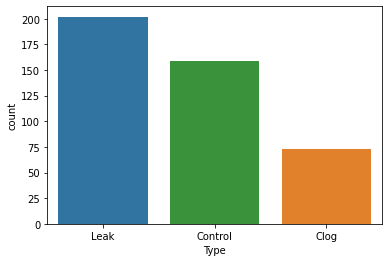

Leak       202
Control    159
Clog        73
Name: Type, dtype: int64


In [6]:
sns.countplot(data=Data, x="Type",palette={"Leak":"tab:blue","Control":"tab:green","Clog":"tab:orange"})
plt.show()
s = df['Type'].value_counts()
print(s)

In [7]:
predictors = ['mean','median','prctile33','min','prctile5','max','prctile95', 'std', 'MAD',
'skewness','IQR','MTD','meanci_1','meanci_2','Diff_median_of_plot','Diff_mean_of_plot','Diff_std_of_plot', 
'Diff_median_of_row','Diff_mean_of_row','Diff_std_of_row', 'mean_first_ring', 'mean_second_ring',
'mean_third_ring','mean_core', 'median_first_ring','median_second_ring', 'median_third_ring',
'median_core', 'CWSI', 'CWSI_minus_CWSI_of_row','kurtosis']
len(predictors)

31

# Histogramm, Boxplots, and Scatterplots with a regression lines

In [8]:
def hue_regplot(data, x, y, hue, palette=None, **kwargs):
    from matplotlib.cm import get_cmap
    
    regplots = []
    
    levels = data[hue].unique()
    
    if palette is None:
        default_colors = get_cmap('tab10')
        palette = {k: default_colors(i) for i, k in enumerate(levels)}
    
    for key in levels:
        regplots.append(
            sns.regplot(
                x=x,
                y=y,
                data=data[data[hue] == key],
                color=palette[key],
                **kwargs
            )
        )
    
    return regplots

In [13]:
def disp_hue_regplot(Data):
    sns.set(font_scale=2)
    sns.set_style("whitegrid")
    import math
    rows_in_fig = 6
    a=rows_in_fig #len(predictors)
    b=3
    c=1
    var_number =1
    palette={"Leak":"tab:blue","Control":"tab:green","Clog":"tab:orange"} 
    # fig = plt.figure(figsize=(30,a*8))
    fig, axes = plt.subplots(a,b,figsize=(35,a*8))
    fig.tight_layout(h_pad=5)

    for i in Data[predictors]:
        plt.xlabel(' ')
        sns.boxplot(x="Type", y=i, data=Data,palette=palette,boxprops=dict(alpha=.4),ax=axes[c-1,0])

        plt.xlabel(' ')
        sns.histplot(Data, x=i, hue="Type",hue_order=["Leak","Control","Clog"],kde=True,legend= True,palette=palette,alpha=.3,
                     line_kws=dict(linewidth=5),ax=axes[c-1,1])
        axes[c-1,1].set_title(i, fontsize=25,fontweight="bold")

        plt.xlabel(' ')
        hue_regplot(data=Data, x=i, y='SWP', hue='Type',palette=palette, ax=axes[c-1,2])
        axes[c-1,2].set_title("(%s)" % var_number,fontsize=25,fontweight="bold",loc='right')

        c=c+1
        var_number = var_number+1
        if c==rows_in_fig+1:
            plt.show()
            fig, axes = plt.subplots(a,b,figsize=(35,a*8))
            fig.tight_layout(h_pad=5)
            c = 1
    plt.show()
    

## Kemda & Lavi

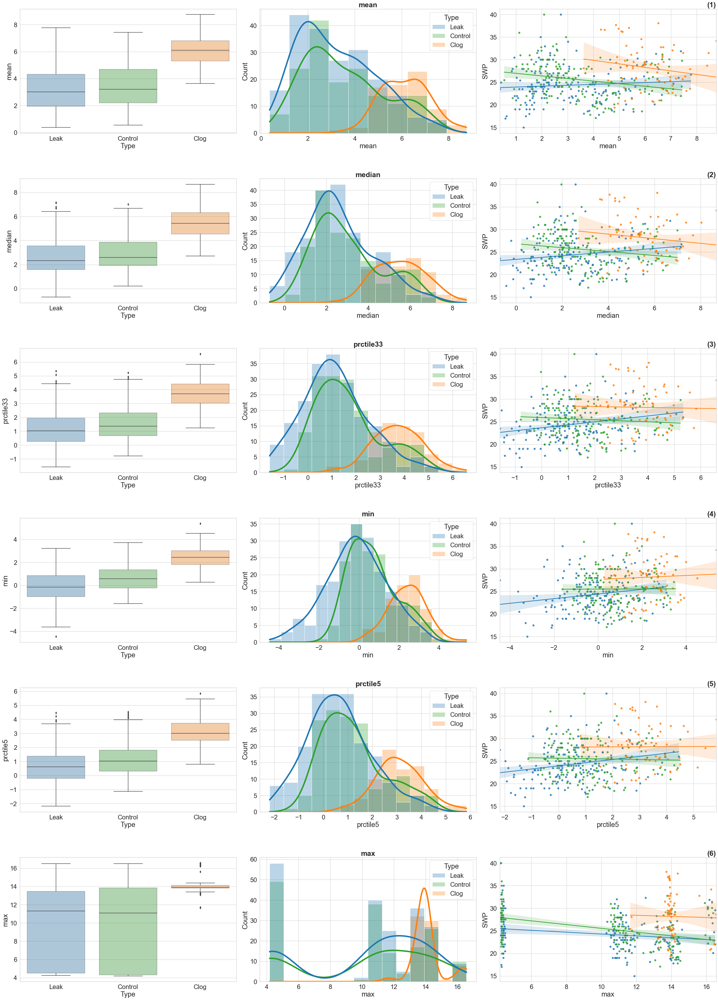

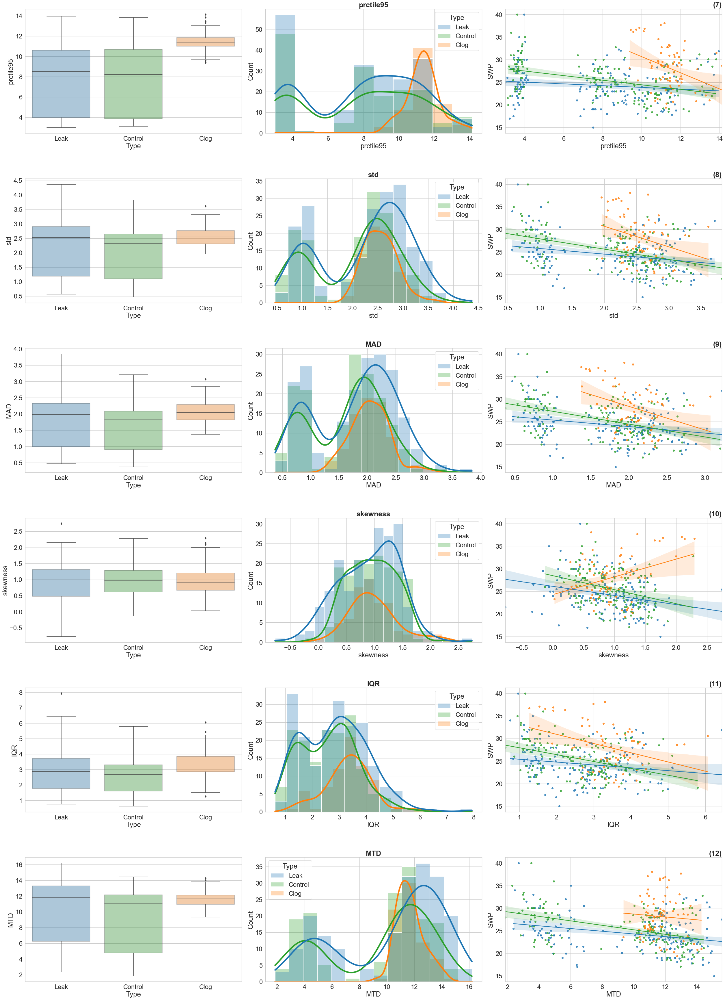

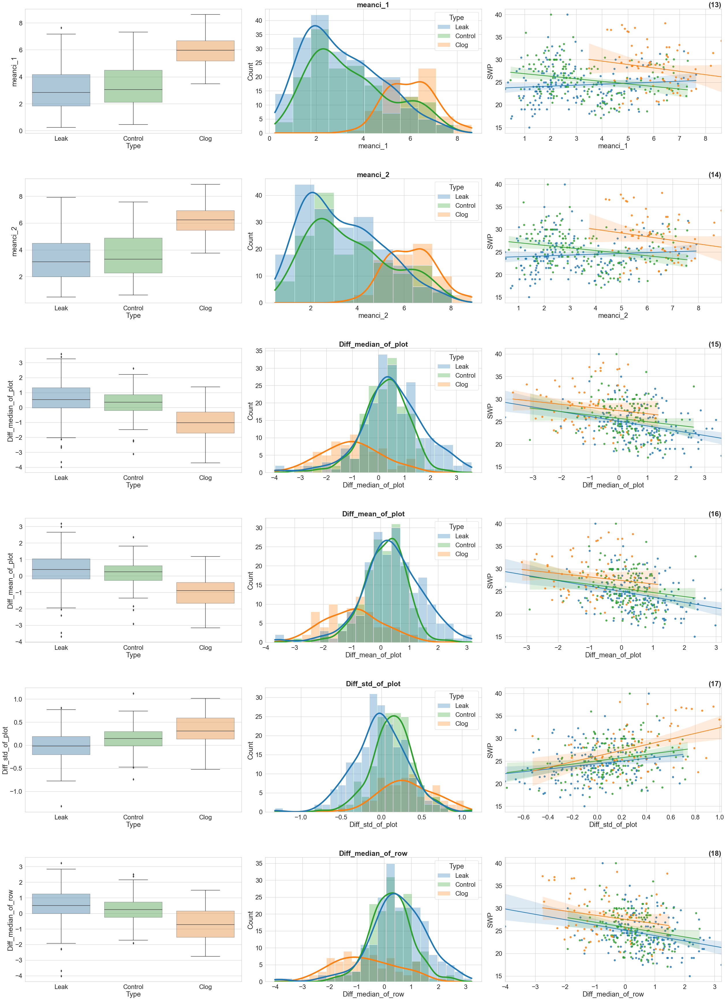

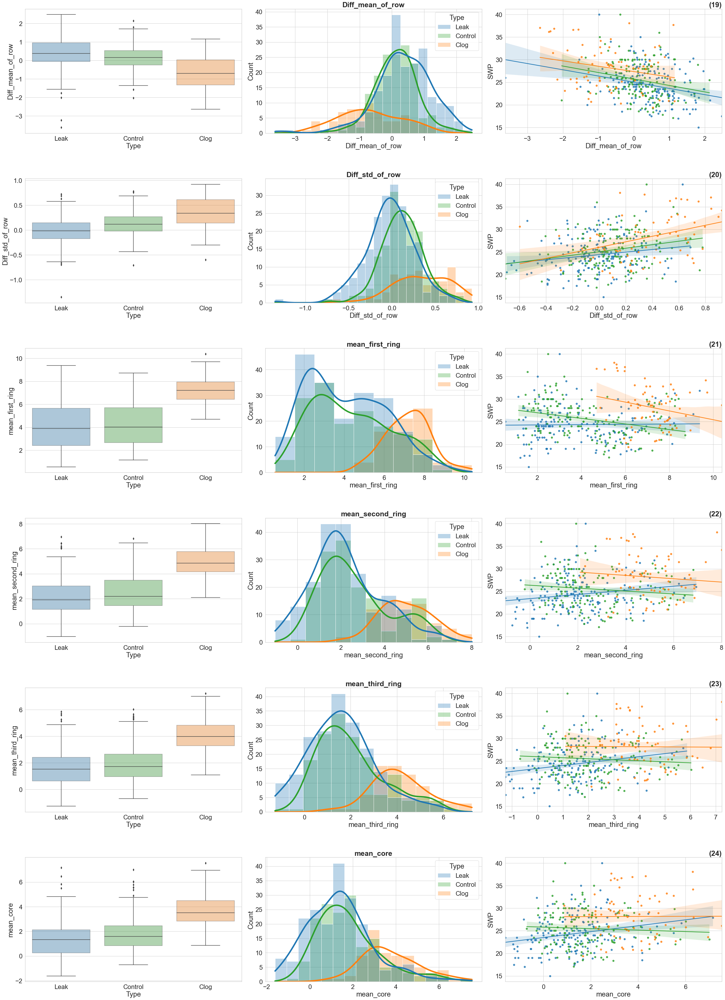

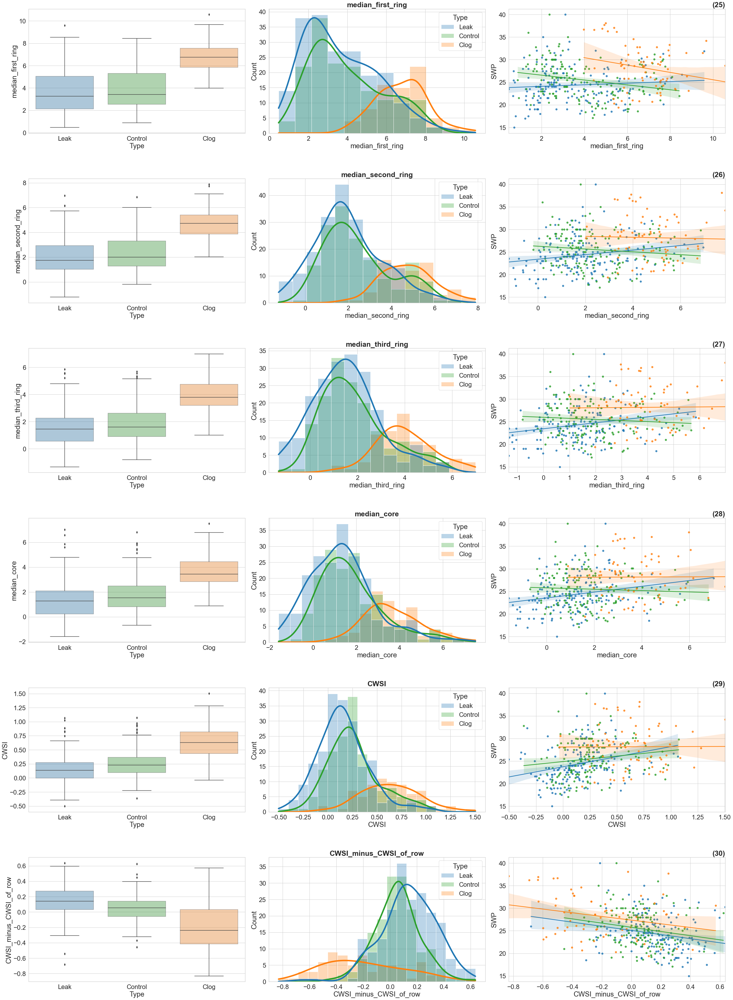

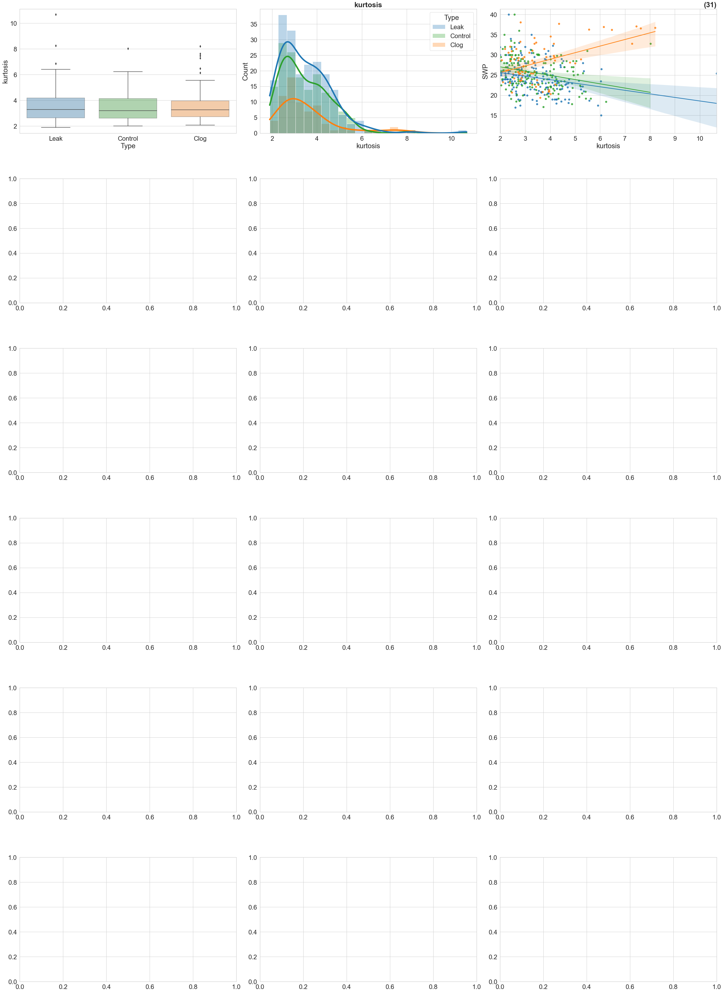

In [14]:
disp_hue_regplot(Data)

## Kedma

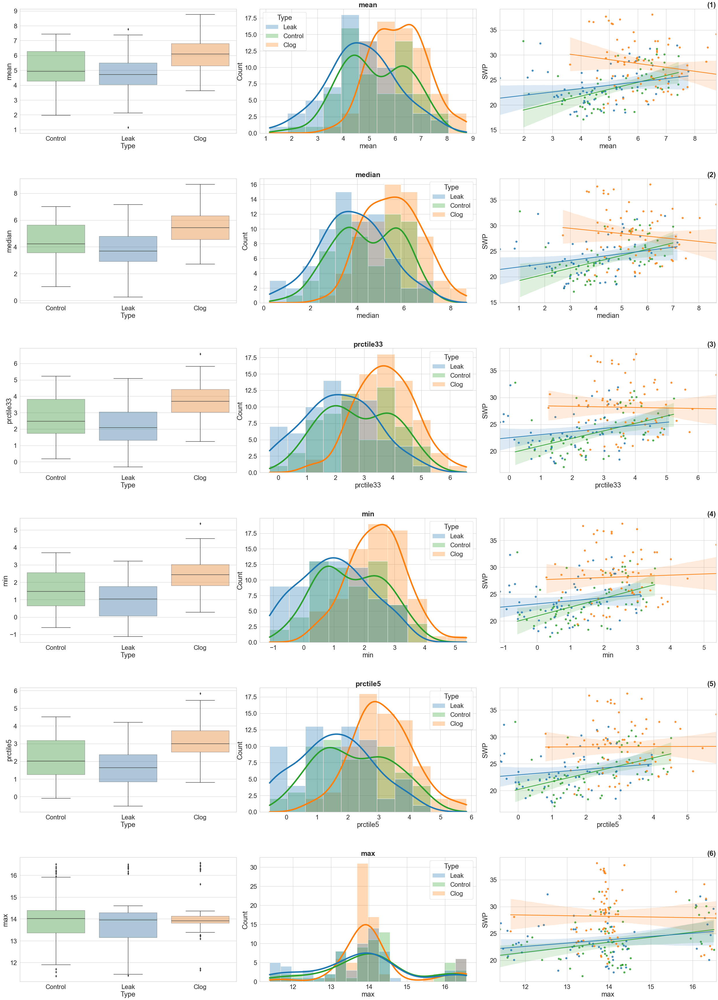

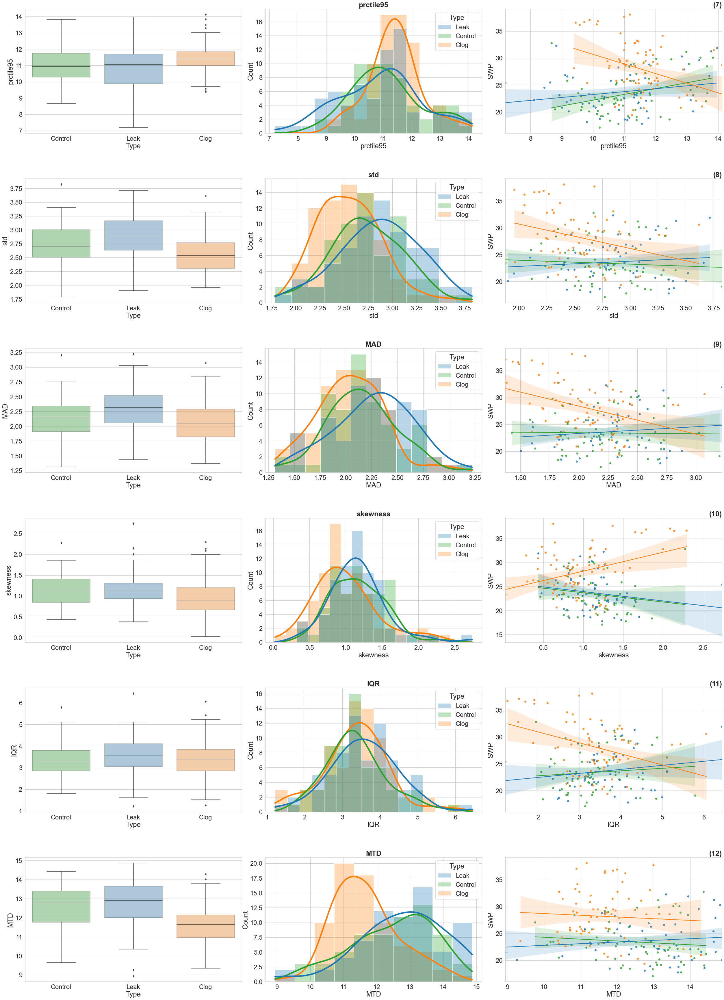

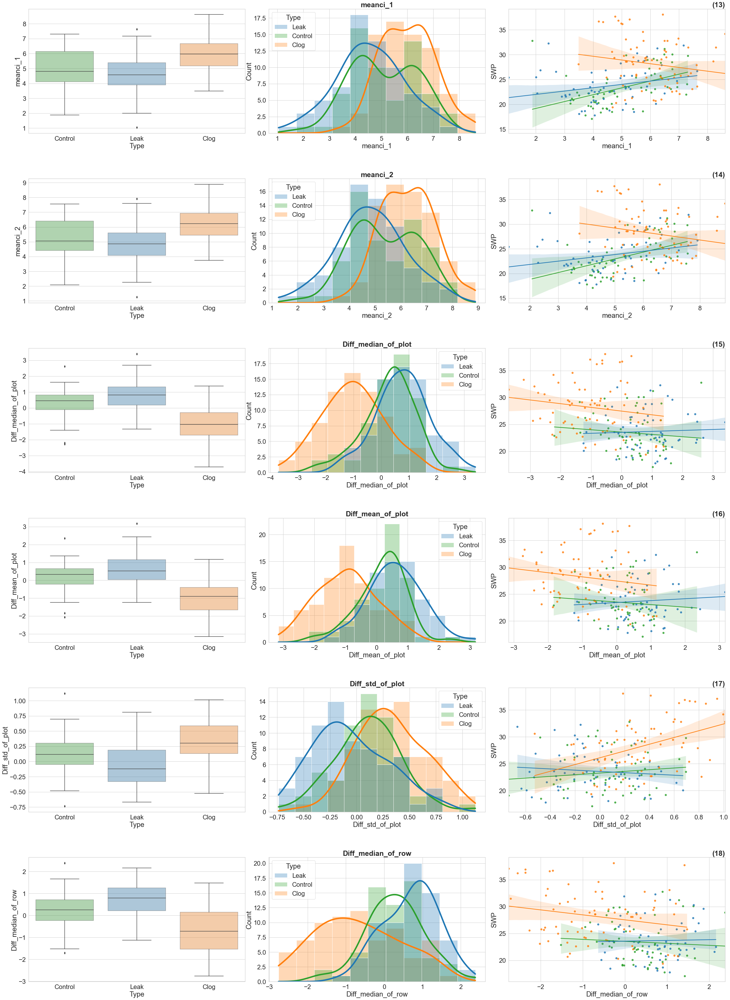

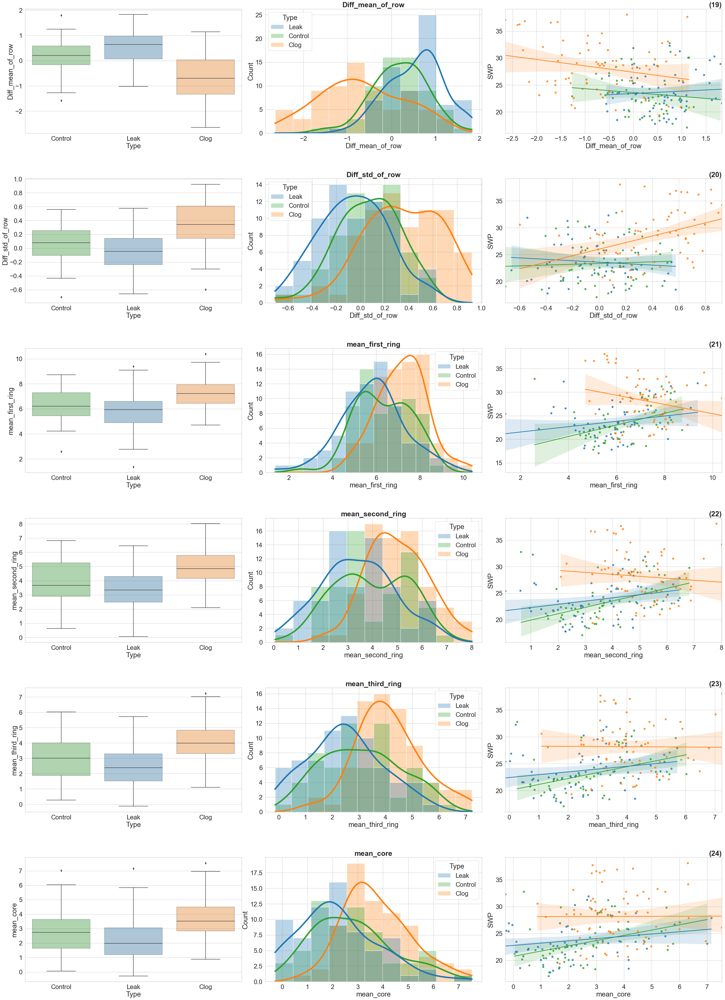

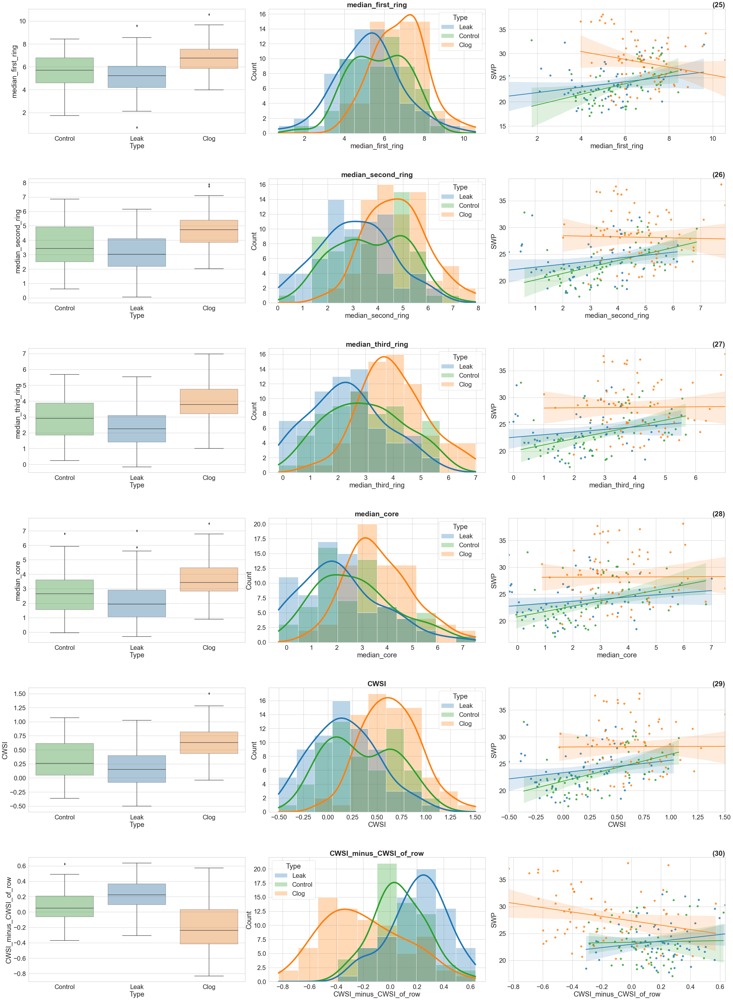

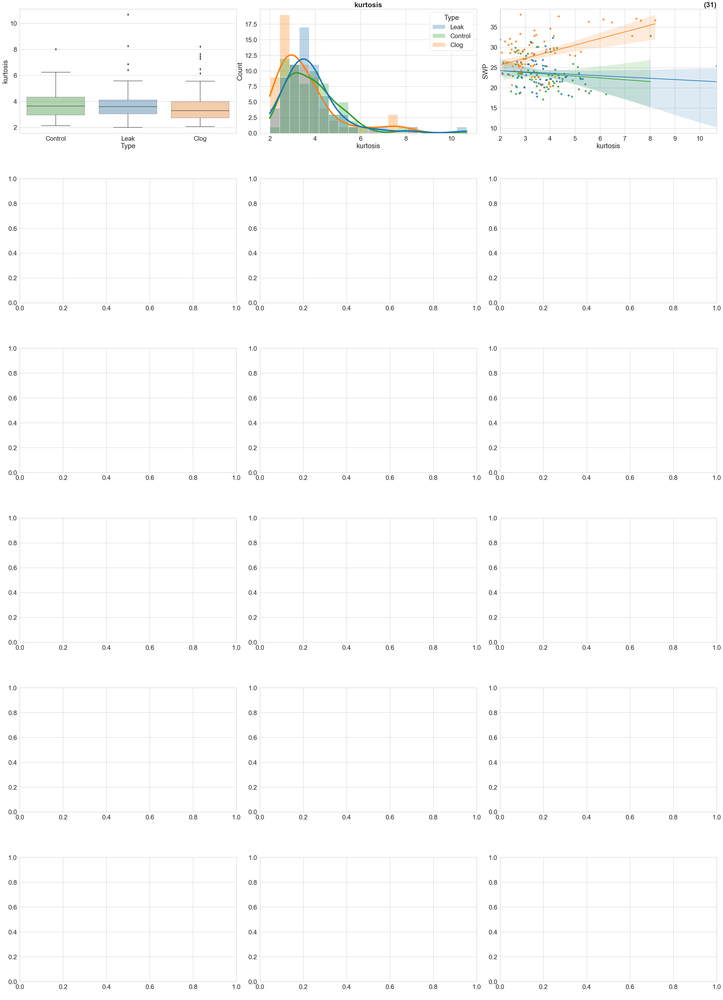

In [16]:
Data_kedma =Data[Data.Site_Name == 'Kedma'].copy(True) 
disp_hue_regplot(Data_kedma)

## Lavi

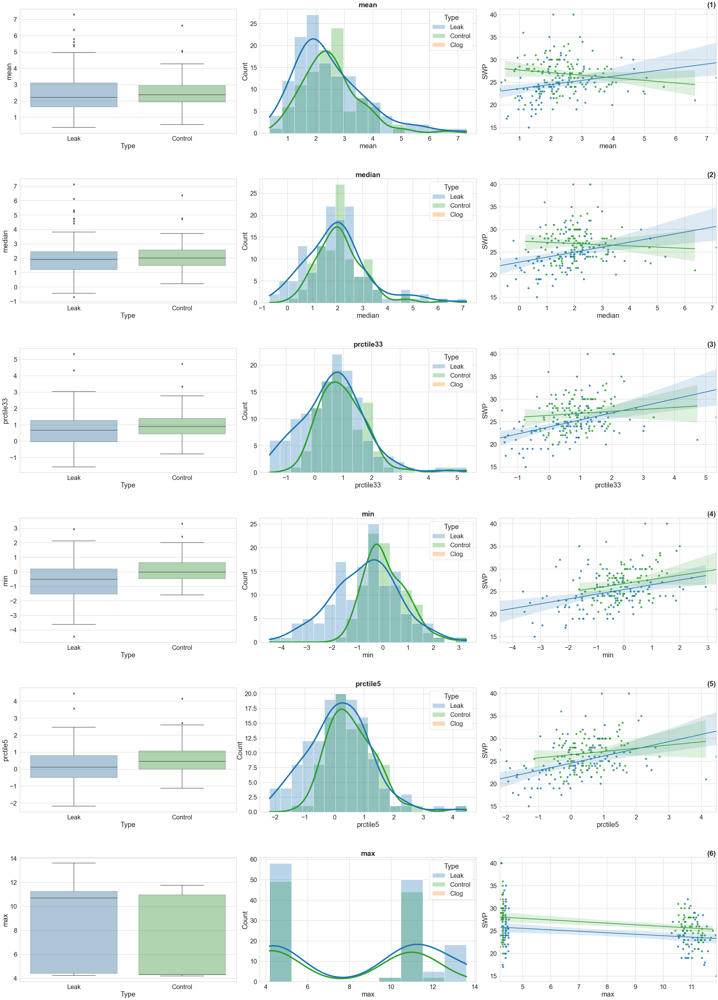

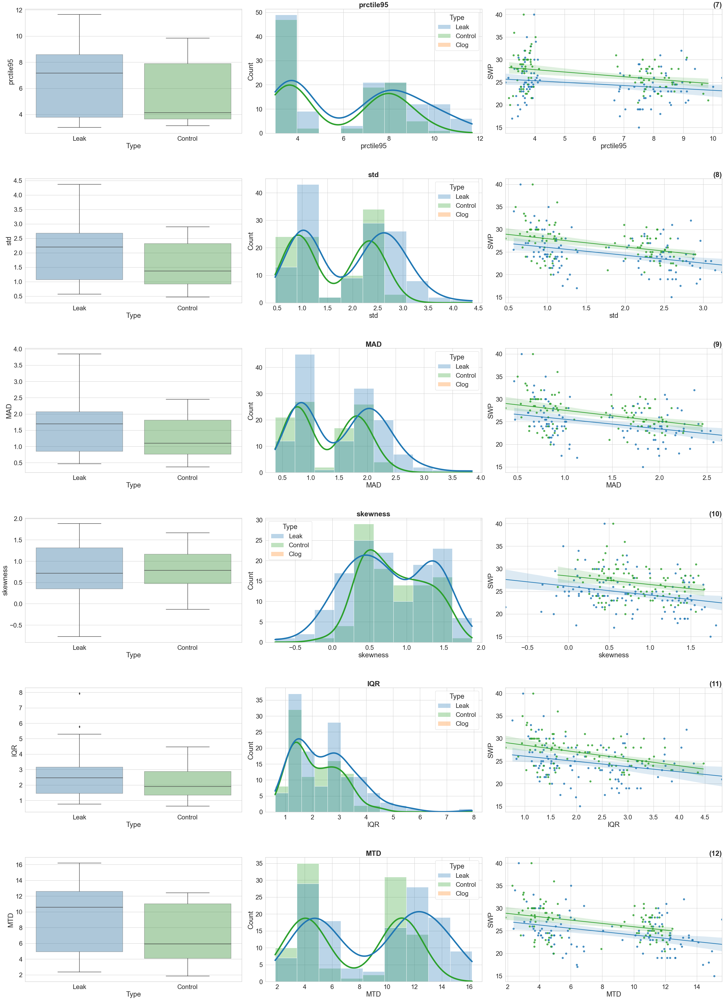

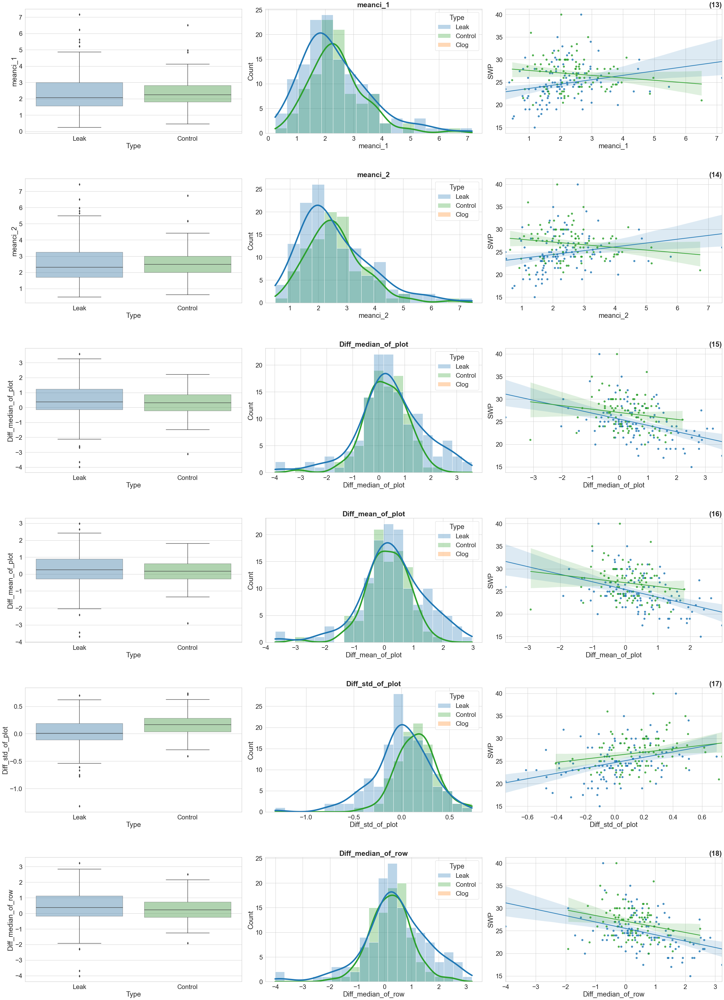

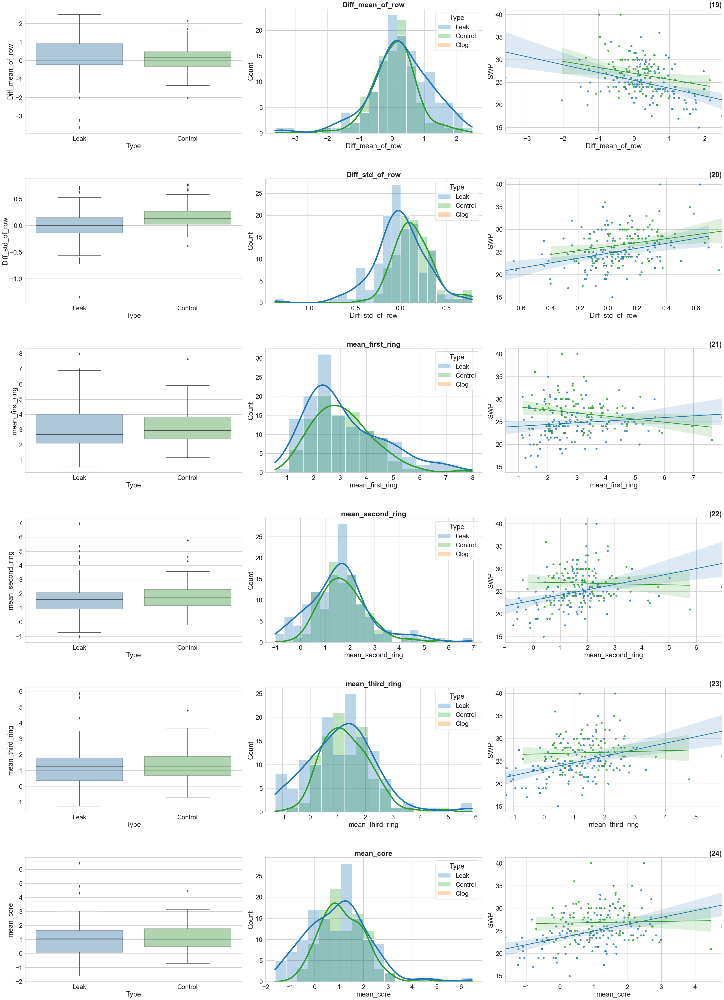

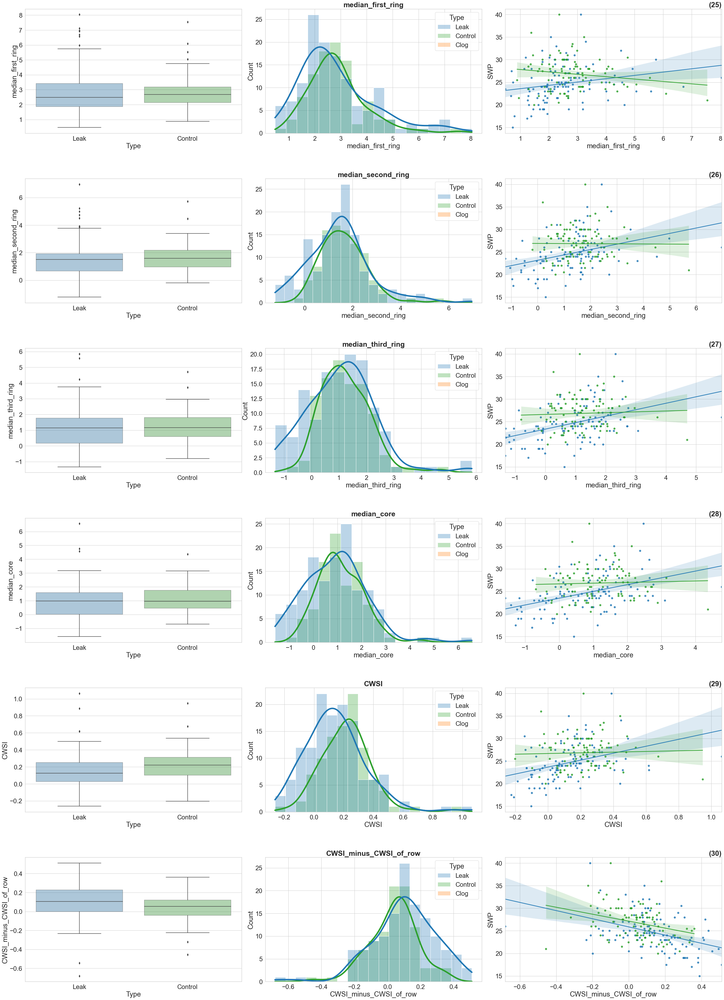

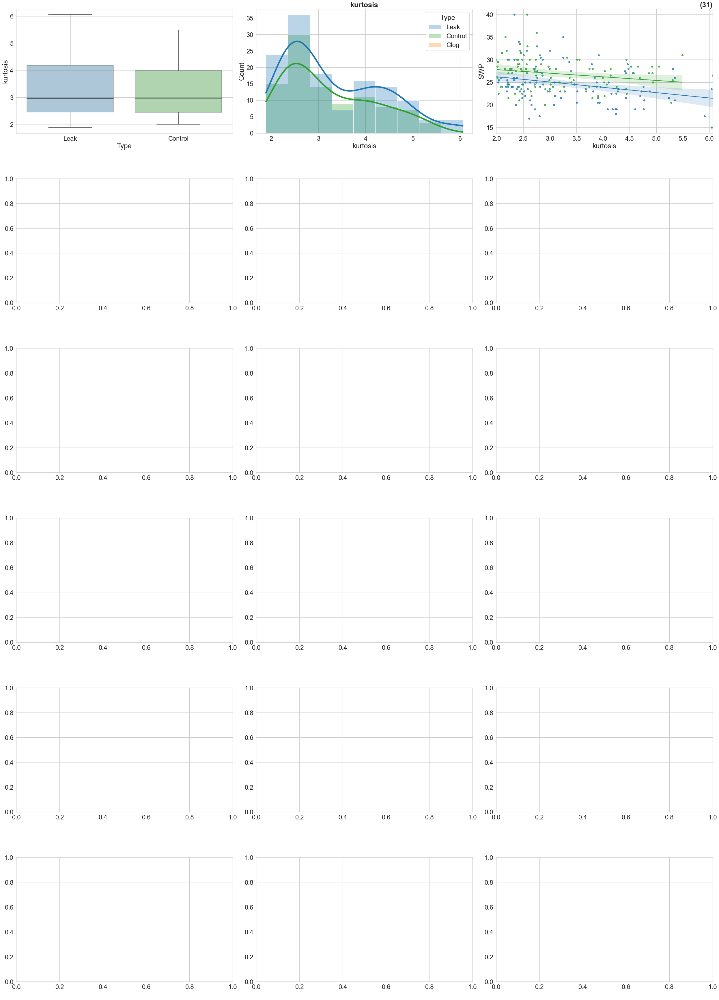

In [17]:
Data_Lavi =Data[Data.Site_Name == 'Lavi'].copy(True) 
disp_hue_regplot(Data_Lavi)

# Outliers

## Kemda & Lavi

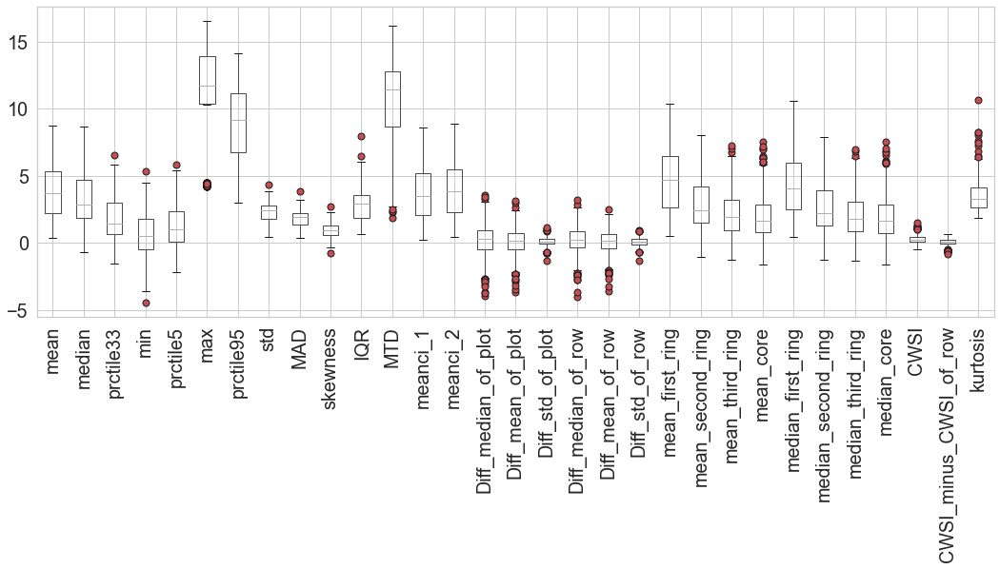

In [59]:
sns.set(font_scale=1.8)
sns.set_style("whitegrid")

df_to_exclude_outliers=Data[predictors].copy(True)
flierprops = dict(marker='o', markerfacecolor='r', markersize=7,linestyle='none', markeredgecolor='k');
df_to_exclude_outliers.boxplot(figsize=(18,6),flierprops=flierprops) ;
plt.xticks(rotation=90);

In [60]:
import collections
df_without_outliters=Data.copy(True)

outlieres = []
for i in predictors: 
    Q1 = np.quantile(Data[i],0.25)
    Q3 = np.quantile(Data[i],0.75)
    IQR = Q3 - Q1
    lower, upper = Q1-1.5*IQR, Q3+1.5*IQR
    outlieres.append(df_without_outliters[df_without_outliters[i] < lower].index)
    outlieres.append(df_without_outliters[df_without_outliters[i] > upper].index)

flat_list = [item for sublist in outlieres for item in sublist]
Counter = collections.Counter(flat_list)
outlieres_to_drop={x: count for x, count in Counter.items() if count >= 1}
print('indices to drop:',len(outlieres_to_drop.keys()))

df_without_outliters = df_without_outliters.drop(outlieres_to_drop.keys())
df_without_outliters.to_excel("data_Kedma&Lavi_without_outlires_based_on_merged.xlsx") 

indices to drop: 160


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 274 entries, 0 to 273
Data columns (total 36 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   RTK_Num_All_Plots_Data  274 non-null    int64  
 1   Plot_All_Plots_Data     274 non-null    object 
 2   Site_Name               274 non-null    object 
 3   mean                    274 non-null    float64
 4   min                     274 non-null    float64
 5   prctile5                274 non-null    float64
 6   max                     274 non-null    float64
 7   prctile95               274 non-null    float64
 8   std                     274 non-null    float64
 9   MTD                     274 non-null    float64
 10  median                  274 non-null    float64
 11  skewness                274 non-null    float64
 12  kurtosis                274 non-null    float64
 13  IQR                     274 non-null    float64
 14  MAD                     274 non-null    fl

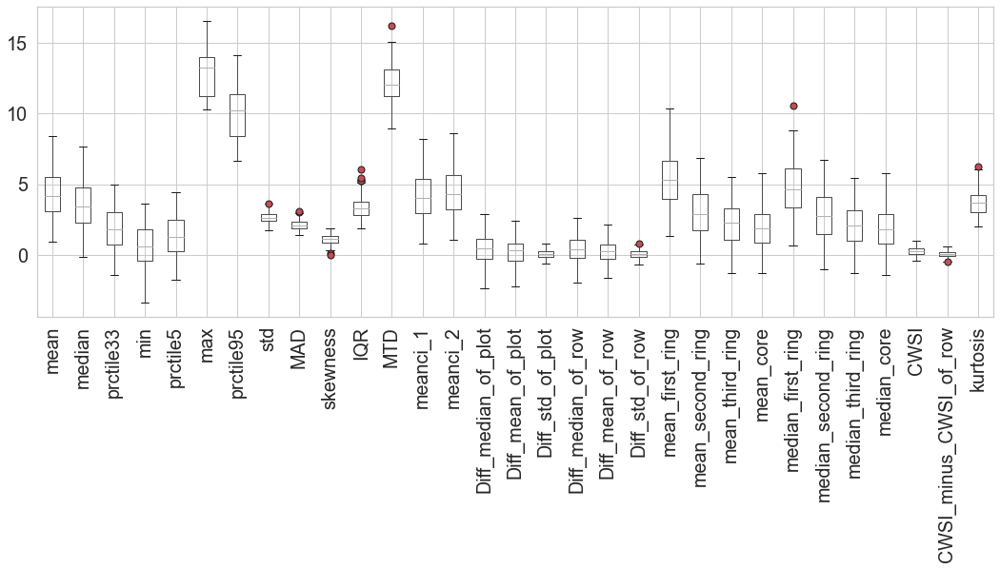

In [61]:
df_out = pd.read_excel(os.path.join(os.getcwd(), 'data_Kedma&Lavi_without_outlires_based_on_merged.xlsx')).iloc[: , 1:]
# df_out1.dropna(how='any')
flierprops = dict(marker='o', markerfacecolor='r', markersize=7,linestyle='none', markeredgecolor='k')
df_out[predictors].boxplot(figsize=(18,6),flierprops=flierprops) 
plt.xticks(rotation=90)
df_out.info()

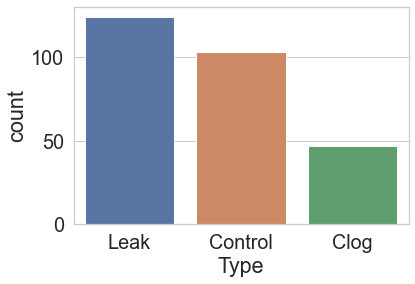

Leak       124
Control    103
Clog        47
Name: Type, dtype: int64


In [62]:
sns.countplot(data=df_out, x="Type")
plt.show()
s = df_out['Type'].value_counts()
print(s)

## Kedma

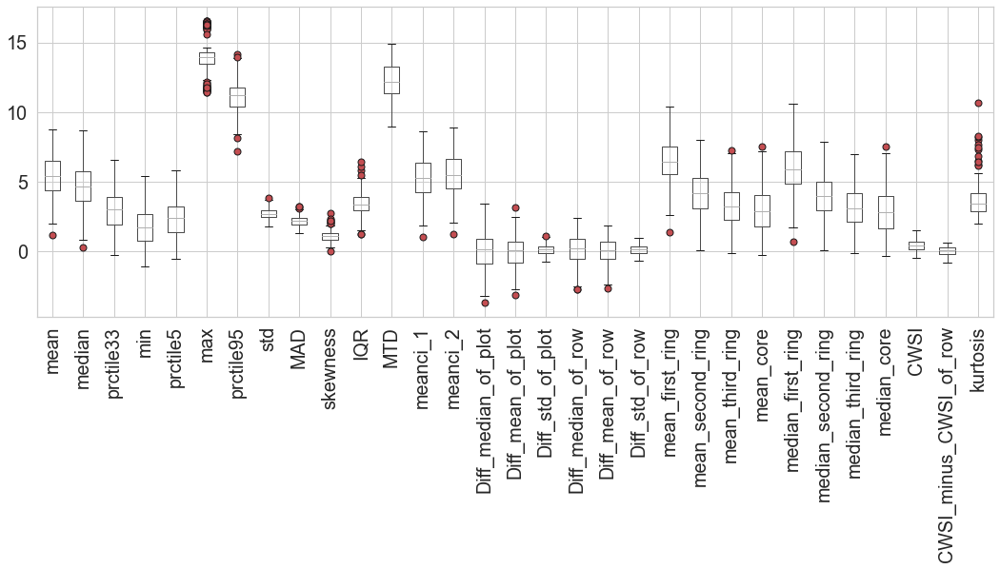

In [63]:
sns.set(font_scale=1.8)
sns.set_style("whitegrid")
df_to_exclude_outliers_kedma =Data[Data.Site_Name == 'Kedma'][predictors].copy(True) 
flierprops = dict(marker='o', markerfacecolor='r', markersize=7,linestyle='none', markeredgecolor='k');
df_to_exclude_outliers_kedma.boxplot(figsize=(18,6),flierprops=flierprops) ;
plt.xticks(rotation=90);

In [64]:
import collections
df_without_outliters_kedma=Data[Data.Site_Name == 'Kedma'].copy(True)
Data_kedma =Data[Data.Site_Name == 'Kedma'].copy(True)
outlieres = []
for i in predictors: 
    Q1 = np.quantile(Data_kedma[i],0.25)
    Q3 = np.quantile(Data_kedma[i],0.75)
    IQR = Q3 - Q1
    lower, upper = Q1-1.5*IQR, Q3+1.5*IQR
    outlieres.append(df_without_outliters_kedma[df_without_outliters_kedma[i] < lower].index)
    outlieres.append(df_without_outliters_kedma[df_without_outliters_kedma[i] > upper].index)

flat_list = [item for sublist in outlieres for item in sublist]
Counter = collections.Counter(flat_list)
outlieres_to_drop={x: count for x, count in Counter.items() if count >= 2}
print('indices to drop:',len(outlieres_to_drop.keys()))

df_without_outliters_kedma = df_without_outliters_kedma.drop(outlieres_to_drop.keys())
df_without_outliters_kedma.to_excel("data_Kedma_without_outlires.xlsx") 

indices to drop: 15


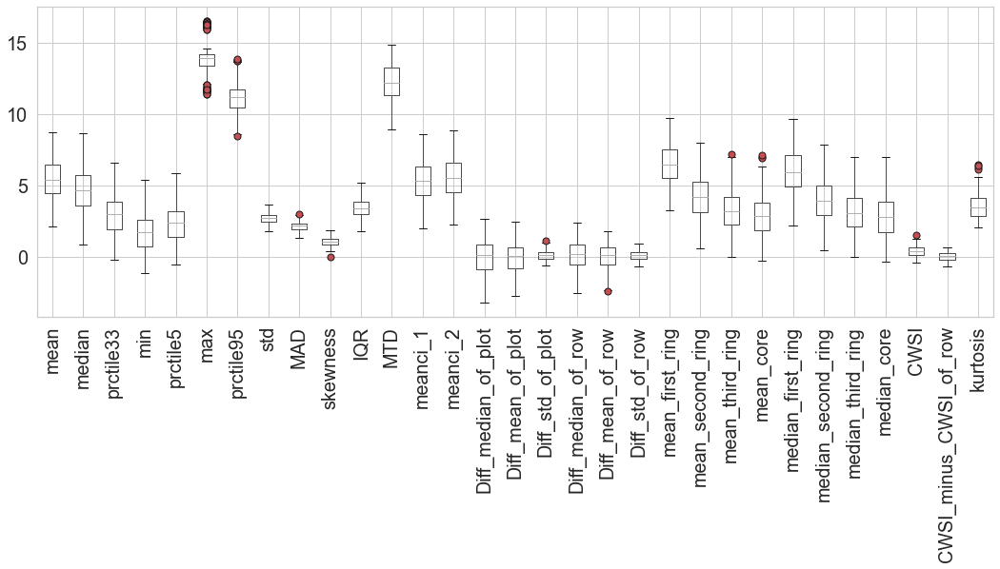

In [65]:
df_out_Kedma = pd.read_excel(os.path.join(os.getcwd(), 'data_Kedma_without_outlires.xlsx')).iloc[: , 1:]
# df_out1.dropna(how='any')
flierprops = dict(marker='o', markerfacecolor='r', markersize=7,linestyle='none', markeredgecolor='k')
df_out_Kedma[predictors].boxplot(figsize=(18,6),flierprops=flierprops) 
plt.xticks(rotation=90);

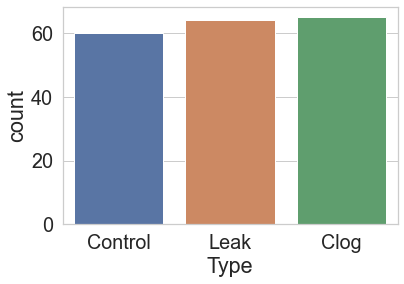

Kedma:
 Clog       65
Leak       64
Control    60
Name: Type, dtype: int64

Overall Kedma:
 189


In [66]:
sns.countplot(data=df_out_Kedma, x="Type")
plt.show()
s_Kedma = df_out_Kedma['Type'].value_counts()
print('Kedma:\n',s_Kedma)
print('\nOverall Kedma:\n',s_Kedma.sum())

## Lavi

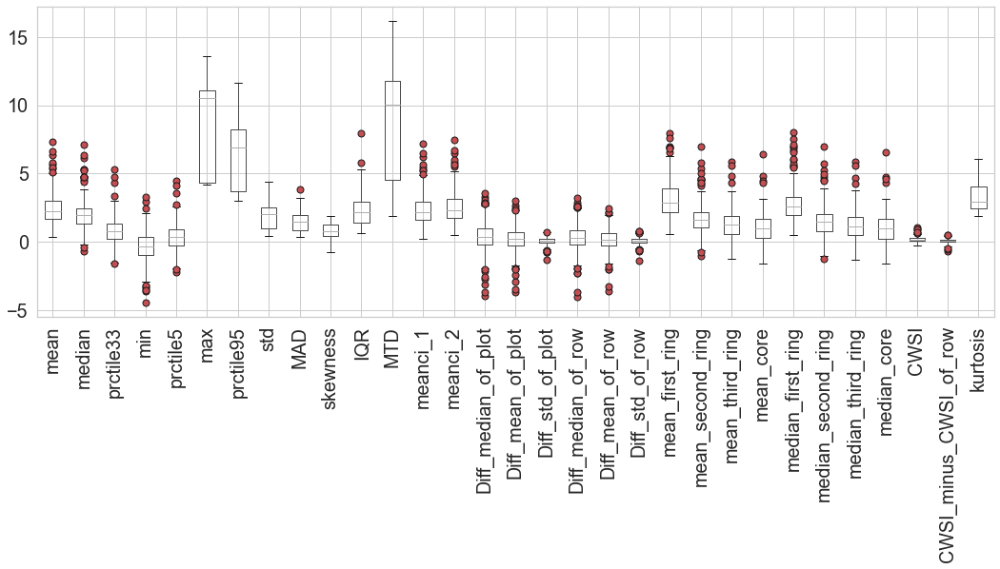

In [67]:
sns.set(font_scale=1.8)
sns.set_style("whitegrid")
df_to_exclude_outliers_lavi =Data[Data.Site_Name == 'Lavi'][predictors].copy(True) 
flierprops = dict(marker='o', markerfacecolor='r', markersize=7,linestyle='none', markeredgecolor='k');
df_to_exclude_outliers_lavi.boxplot(figsize=(18,6),flierprops=flierprops) ;
plt.xticks(rotation=90);

In [68]:
import collections
df_to_exclude_outliers_lavi=Data[Data.Site_Name == 'Lavi'].copy(True)
Data_lavi =Data[Data.Site_Name == 'Lavi'].copy(True)

outlieres = []
for i in predictors: 
    Q1 = np.quantile(Data_lavi[i],0.25)
    Q3 = np.quantile(Data_lavi[i],0.75)
    IQR = Q3 - Q1
    lower, upper = Q1-1.5*IQR, Q3+1.5*IQR
    outlieres.append(df_to_exclude_outliers_lavi[df_to_exclude_outliers_lavi[i] < lower].index)
    outlieres.append(df_to_exclude_outliers_lavi[df_to_exclude_outliers_lavi[i] > upper].index)

flat_list = [item for sublist in outlieres for item in sublist]
Counter = collections.Counter(flat_list)
outlieres_to_drop={x: count for x, count in Counter.items() if count >= 2}
print('indices to drop:',len(outlieres_to_drop.keys()))

df_to_exclude_outliers_lavi = df_to_exclude_outliers_lavi.drop(outlieres_to_drop.keys())
df_to_exclude_outliers_lavi.to_excel("data_Lavi_without_outlires.xlsx") 

indices to drop: 26


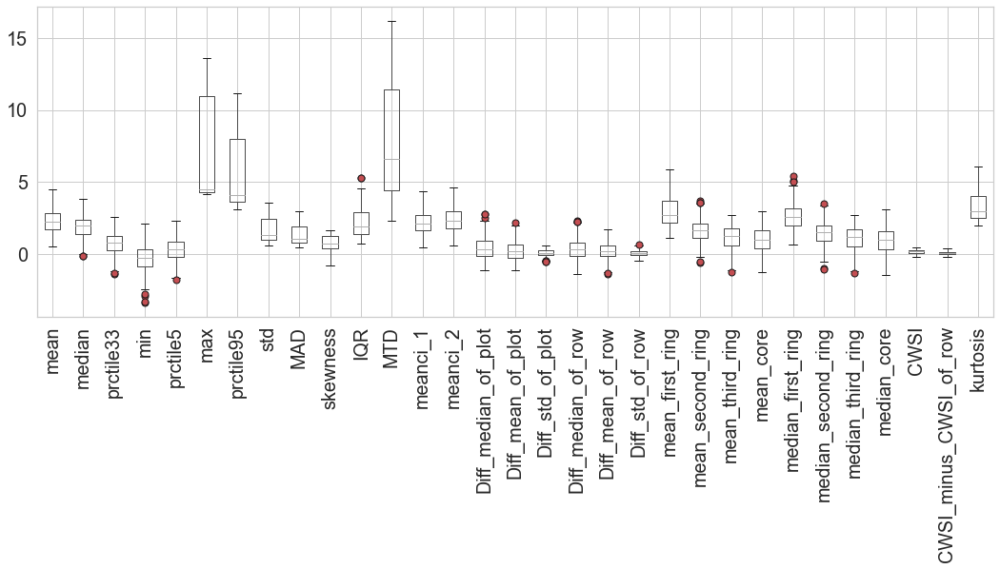

In [69]:
df_out_Lavi = pd.read_excel(os.path.join(os.getcwd(), 'data_Lavi_without_outlires.xlsx')).iloc[: , 1:]
# df_out1.dropna(how='any')
flierprops = dict(marker='o', markerfacecolor='r', markersize=7,linestyle='none', markeredgecolor='k')
df_out_Lavi[predictors].boxplot(figsize=(18,6),flierprops=flierprops) 
plt.xticks(rotation=90);

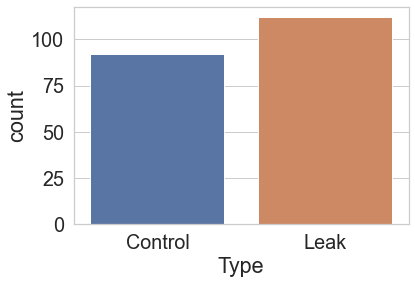

Lavi:
 Leak       112
Control     92
Name: Type, dtype: int64

 Overall Lavi:
 204


Lavi & Kedma:
 Leak       176
Control    152
Clog        65
Name: Type, dtype: int64


Overall Lavi & Kedma
 393


In [70]:
sns.countplot(data=df_out_Lavi, x="Type")
plt.show()
s_Lavi = df_out_Lavi['Type'].value_counts()
print('Lavi:\n',s_Lavi)
print('\n Overall Lavi:\n',s_Lavi.sum())

s['Leak']= s_Lavi['Leak']+s_Kedma['Leak']
s['Control']= s_Lavi['Control']+s_Kedma['Control']
s['Clog'] = s_Kedma['Clog']
print('\n\nLavi & Kedma:\n',s)
print('\n\nOverall Lavi & Kedma\n',s.sum())


## df after combinning the two datsets after removing of outliers

In [71]:
df_out = pd.concat([df_out_Lavi,df_out_Kedma])
df_out.to_excel("data_Kedma&Lavi_without_outlires.xlsx") 

In [72]:
df_out.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 393 entries, 0 to 188
Data columns (total 36 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   RTK_Num_All_Plots_Data  393 non-null    int64  
 1   Plot_All_Plots_Data     393 non-null    object 
 2   Site_Name               393 non-null    object 
 3   mean                    393 non-null    float64
 4   min                     393 non-null    float64
 5   prctile5                393 non-null    float64
 6   max                     393 non-null    float64
 7   prctile95               393 non-null    float64
 8   std                     393 non-null    float64
 9   MTD                     393 non-null    float64
 10  median                  393 non-null    float64
 11  skewness                393 non-null    float64
 12  kurtosis                393 non-null    float64
 13  IQR                     393 non-null    float64
 14  MAD                     393 non-null    fl